In [8]:
import numpy as np
import pandas as pd
import scipy.stats as scs

np.random.seed(0)

import matplotlib.pyplot as plt

In [46]:
covid = pd.read_csv('covid_clean.csv')

In [3]:
covid.head()

,fips,State,County,EconomicRegion,DensPerSqMile,New_case_rate,Infection_rate_change,per_gop,per_dem,low_mask_adoption,mask_adoption,AnyVaccineHesitancy,FullyVaccinatedAdults,Geographical_Point,Family,PercReligion
0,1001,Alabama,Autauga County,Southeast,91.8,9.46,2.04,0.714368,0.270184,0.261,0.739,0.5190,0.288,POINT (-86.844516 32.756889),Evangelical,0.763739
1,1003,Alabama,Baldwin County,Southeast,114.6,14.33,9.47,0.761714,0.224090,0.240,0.759,0.4701,0.336,POINT (-86.844516 32.756889),Evangelical,0.625556
2,1005,Alabama,Barbour County,Southeast,31.0,10.42,7.72,0.534512,0.457882,0.308,0.692,0.5287,0.257,POINT (-86.844516 32.756889),Evangelical,0.615071
3,1007,Alabama,Bibb County,Southeast,36.8,5.74,1.27,0.784263,0.206983,0.150,0.850,0.5724,0.222,POINT (-86.844516 32.756889),Evangelical,0.511761
4,1009,Alabama,Blount County,Southeast,88.9,8.65,3.96,0.895716,0.095694,0.347,0.653,0.5632,0.215,POINT (-86.844516 32.756889),Evangelical,0.711821


In [53]:
#clean up nans
covid.FullyVaccinatedAdults = covid.FullyVaccinatedAdults.fillna(0)

In [19]:
#pick the 4 realistically best predictors of target data (Infection_rate_change)

# 4 top predictive columns - we think
# DensityPerSquareMile -> the denser the population, the greater the spread?
# LowMaskAdoption -> lower the mask usage, the greater the spread?
# VaccineHesitancy -> lower the vaccine rate, the greater the spread?
# FullyVaccinatedAdults -> higher the vaccination rate, the lower the spread?
cols = ['Infection_rate_change','DensPerSqMile','low_mask_adoption','AnyVaccineHesitancy','FullyVaccinatedAdults']
X = covid[cols]

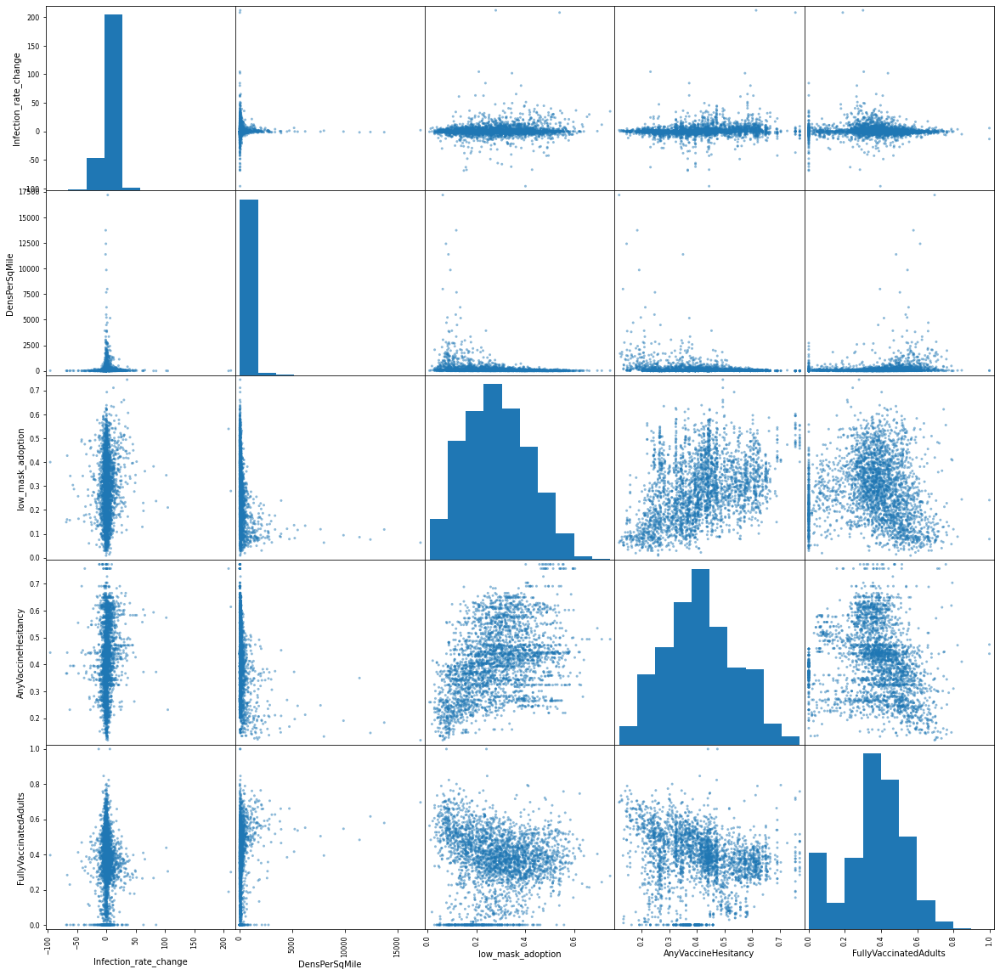

In [20]:

pd.plotting.scatter_matrix(covid[cols], figsize=(20,20));


In [21]:

y = X.pop('Infection_rate_change')

#separate train / test data
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(X, y)


In [22]:
import scipy.stats as scs
import statsmodels.api as sm

def summary_model(X, y, label='scatter'):
    X = sm.add_constant(X)
    model = sm.OLS(y, X).fit()
    summary = model.summary()
    return summary

def plot_model(X, y, label='Residual Plot'):
    model = sm.OLS(y, X).fit()
    student_resids = model.outlier_test()['student_resid']
    y_hats = model.predict(X)

    plt.scatter(y_hats, student_resids, alpha = .35, label=label)
    plt.legend()
    plt.show()

In [23]:
summary_model(X, y)

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Infection_rate_change   R-squared:                       0.023
Model:                               OLS   Adj. R-squared:                  0.022
Method:                    Least Squares   F-statistic:                     17.65
Date:                   Tue, 13 Jul 2021   Prob (F-statistic):           2.49e-14
Time:                           18:06:43   Log-Likelihood:                -11375.
No. Observations:                   2978   AIC:                         2.276e+04
Df Residuals:                       2973   BIC:                         2.279e+04
Df Model:                              4                                         
Covariance Type:               nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -4.4062      0.897     -4.910      0.000      -6.166      -2.647
DensPerSqMile             0.0005      0.000      1.715      0.086   -7.33e-05       0.001
low_mask_adoption         2.6248      1.734      1.513      0.130      -0.776       6.025
AnyVaccineHesitancy      12.1654      1.759      6.916      0.000       8.716      15.615
FullyVaccinatedAdults    -0.5385      1.185     -0.455      0.649      -2.861       1.784
==============================================================================
Omnibus:                     3224.381   Durbin-Watson:                   1.882
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1096363.963
Skew:                           4.833   Prob(JB):                         0.00
Kurtosis:                      96.500   Cond. No.                     7.59e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.59e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [24]:
#does a region have any influence on the 
covid = pd.get_dummies(covid, columns=['EconomicRegion'])

covid.head()

,fips,State,County,DensPerSqMile,New_case_rate,Infection_rate_change,per_gop,per_dem,low_mask_adoption,mask_adoption,...,Family,PercReligion,EconomicRegion_Far West,EconomicRegion_Great Lakes,EconomicRegion_Mideast,EconomicRegion_New England,EconomicRegion_Plains,EconomicRegion_Rocky Mountain,EconomicRegion_Southeast,EconomicRegion_Southwest
0,1001,Alabama,Autauga County,91.8,9.46,2.04,0.714368,0.270184,0.261,0.739,...,Evangelical,0.763739,0,0,0,0,0,0,1,0
1,1003,Alabama,Baldwin County,114.6,14.33,9.47,0.761714,0.224090,0.240,0.759,...,Evangelical,0.625556,0,0,0,0,0,0,1,0
2,1005,Alabama,Barbour County,31.0,10.42,7.72,0.534512,0.457882,0.308,0.692,...,Evangelical,0.615071,0,0,0,0,0,0,1,0
3,1007,Alabama,Bibb County,36.8,5.74,1.27,0.784263,0.206983,0.150,0.850,...,Evangelical,0.511761,0,0,0,0,0,0,1,0
4,1009,Alabama,Blount County,88.9,8.65,3.96,0.895716,0.095694,0.347,0.653,...,Evangelical,0.711821,0,0,0,0,0,0,1,0


In [36]:
#does religion play a role
covid.Family.value_counts()

Evangelical           1362
Catholic              1172
Mainline               267
Mormon                 103
Non-denominational      56
Amish                    8
Black Church             8
Mennonite                1
mormon                   1
Name: Family, dtype: int64

In [50]:
covid = covid.replace(to_replace=['Mormon','Mennonite','Black Church','Amish','Non-denominational','mormon'], value='Other')
covid.Family.value_counts()

Evangelical    1362
Catholic       1172
Mainline        267
Other           177
Name: Family, dtype: int64

In [40]:
#does the dominant religion have any influence on the 
covid = pd.get_dummies(covid, columns=['Family'])

covid.head()

,fips,State,County,DensPerSqMile,New_case_rate,Infection_rate_change,per_gop,per_dem,low_mask_adoption,mask_adoption,...,EconomicRegion_Mideast,EconomicRegion_New England,EconomicRegion_Plains,EconomicRegion_Rocky Mountain,EconomicRegion_Southeast,EconomicRegion_Southwest,Family_Catholic,Family_Evangelical,Family_Mainline,Family_Other
0,1001,Alabama,Autauga County,91.8,9.46,2.04,0.714368,0.270184,0.261,0.739,...,0,0,0,0,1,0,0,1,0,0
1,1003,Alabama,Baldwin County,114.6,14.33,9.47,0.761714,0.224090,0.240,0.759,...,0,0,0,0,1,0,0,1,0,0
2,1005,Alabama,Barbour County,31.0,10.42,7.72,0.534512,0.457882,0.308,0.692,...,0,0,0,0,1,0,0,1,0,0
3,1007,Alabama,Bibb County,36.8,5.74,1.27,0.784263,0.206983,0.150,0.850,...,0,0,0,0,1,0,0,1,0,0
4,1009,Alabama,Blount County,88.9,8.65,3.96,0.895716,0.095694,0.347,0.653,...,0,0,0,0,1,0,0,1,0,0


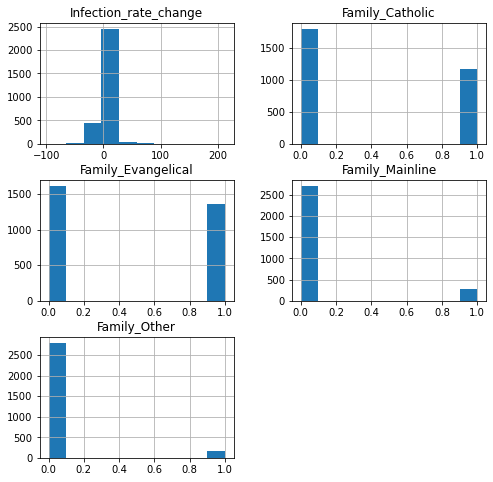

In [43]:
cols = ['Infection_rate_change','Family_Catholic','Family_Evangelical','Family_Mainline','Family_Other']
religion = covid[cols]

religion.hist(figsize=(8,8));

In [47]:
covid.head()

,fips,State,County,EconomicRegion,DensPerSqMile,New_case_rate,Infection_rate_change,per_gop,per_dem,low_mask_adoption,mask_adoption,AnyVaccineHesitancy,FullyVaccinatedAdults,Geographical_Point,Family,PercReligion
0,1001,Alabama,Autauga County,Southeast,91.8,9.46,2.04,0.714368,0.270184,0.261,0.739,0.5190,0.288,POINT (-86.844516 32.756889),Evangelical,0.763739
1,1003,Alabama,Baldwin County,Southeast,114.6,14.33,9.47,0.761714,0.224090,0.240,0.759,0.4701,0.336,POINT (-86.844516 32.756889),Evangelical,0.625556
2,1005,Alabama,Barbour County,Southeast,31.0,10.42,7.72,0.534512,0.457882,0.308,0.692,0.5287,0.257,POINT (-86.844516 32.756889),Evangelical,0.615071
3,1007,Alabama,Bibb County,Southeast,36.8,5.74,1.27,0.784263,0.206983,0.150,0.850,0.5724,0.222,POINT (-86.844516 32.756889),Evangelical,0.511761
4,1009,Alabama,Blount County,Southeast,88.9,8.65,3.96,0.895716,0.095694,0.347,0.653,0.5632,0.215,POINT (-86.844516 32.756889),Evangelical,0.711821


In [72]:
#What columns are we dropping from the model and why?
#low mask adoption  and vaccine hesitancy are strongly correlated and probably contributing to multicollinearity, so dropping low mask adoption
#dropping new case rate because it was used to compute change in case rate
#normalizing change in case rate and density per square mile
#not using PerDem because it is almost exactly 100 - PerGOP
cols = ['DensPerSqMile','Infection_rate_change','per_gop','FullyVaccinatedAdults','PercReligion','Family']

X = covid[cols]
X = pd.get_dummies(X, columns=['Family'])

y = X.pop('Infection_rate_change')

X.head()

KeyError: "['Infection_rate_change'] not in index"

In [55]:
summary_model(X, y)

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Infection_rate_change   R-squared:                       0.021
Model:                               OLS   Adj. R-squared:                  0.019
Method:                    Least Squares   F-statistic:                     9.257
Date:                   Wed, 14 Jul 2021   Prob (F-statistic):           2.22e-11
Time:                           09:19:55   Log-Likelihood:                -11378.
No. Observations:                   2978   AIC:                         2.277e+04
Df Residuals:                       2970   BIC:                         2.282e+04
Df Model:                              7                                         
Covariance Type:               nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -0.7633      1.070     -0.713      0.476      -2.861       1.334
DensPerSqMile             0.0003      0.000      0.882      0.378      -0.000       0.001
per_gop                   3.0895      1.573      1.964      0.050       0.005       6.174
FullyVaccinatedAdults     2.4563      1.342      1.830      0.067      -0.176       5.088
PercReligion             -2.4531      0.954     -2.570      0.010      -4.324      -0.582
Family_Catholic          -0.8413      0.424     -1.985      0.047      -1.672      -0.010
Family_Evangelical        2.2994      0.423      5.435      0.000       1.470       3.129
Family_Mainline          -1.5019      0.656     -2.289      0.022      -2.788      -0.215
Family_Other             -0.7195      0.737     -0.977      0.329      -2.164       0.725
==============================================================================
Omnibus:                     3291.056   Durbin-Watson:                   1.870
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1214572.142
Skew:                           4.995   Prob(JB):                         0.00
Kurtosis:                     101.431   Cond. No.                     5.43e+17
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The smallest eigenvalue is 5.48e-27. This might indicate that there are
strong multicollinearity problems or that the design matrix is singular.
"""

In [56]:
#going to drop density per square mile and Family_other from the model 
X.pop('DensPerSqMile')
X.pop('Family_Other')

X.head()

,per_gop,FullyVaccinatedAdults,PercReligion,Family_Catholic,Family_Evangelical,Family_Mainline
0,0.714368,0.288,0.763739,0,1,0
1,0.761714,0.336,0.625556,0,1,0
2,0.534512,0.257,0.615071,0,1,0
3,0.784263,0.222,0.511761,0,1,0
4,0.895716,0.215,0.711821,0,1,0


In [57]:
summary_model(X, y)

<class 'statsmodels.iolib.summary.Summary'>
"""
                              OLS Regression Results                             
=================================================================================
Dep. Variable:     Infection_rate_change   R-squared:                       0.021
Model:                               OLS   Adj. R-squared:                  0.019
Method:                    Least Squares   F-statistic:                     10.67
Date:                   Wed, 14 Jul 2021   Prob (F-statistic):           9.21e-12
Time:                           09:31:59   Log-Likelihood:                -11378.
No. Observations:                   2978   AIC:                         2.277e+04
Df Residuals:                       2971   BIC:                         2.281e+04
Df Model:                              6                                         
Covariance Type:               nonrobust                                         
=========================================================================================
                            coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------
const                    -1.1599      1.510     -0.768      0.442      -4.120       1.801
per_gop                   2.6377      1.487      1.774      0.076      -0.278       5.554
FullyVaccinatedAdults     2.4565      1.342      1.830      0.067      -0.175       5.088
PercReligion             -2.4243      0.954     -2.542      0.011      -4.294      -0.554
Family_Catholic          -0.1071      0.904     -0.119      0.906      -1.879       1.665
Family_Evangelical        3.0204      0.897      3.367      0.001       1.261       4.779
Family_Mainline          -0.7811      1.074     -0.728      0.467      -2.886       1.324
==============================================================================
Omnibus:                     3290.384   Durbin-Watson:                   1.870
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          1213394.806
Skew:                           4.993   Prob(JB):                         0.00
Kurtosis:                     101.383   Cond. No.                         16.4
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [58]:
from sklearn.linear_model import RidgeCV

model = RidgeCV(alphas=[1e-3, 1e-2, 1e-1, 1]).fit(X, y)
model.score(X,y)


0.021093495852879562

In [73]:
#decision tree model
from sklearn.tree import DecisionTreeRegressor # Import Decision Tree Regressor
from sklearn.model_selection import train_test_split # Import train_test_split function
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1) 



In [74]:
clf = DecisionTreeRegressor()

clf.fit(X_train,y_train)

y_pred = clf.predict(x_test)

print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

ValueError: X has 4 features, but DecisionTreeRegressor is expecting 6 features as input.